# ALTERAÇÃO DE FAIXA DE MATIZES EM UMA IMAGEM NO SISTEMA HSV

    RA117306 | Felipe Gabriel Comin Scheffel
    RA       | Douglas Kenji Sakakibara

O objetivo deste trabalho é implementar e testar um programa que receba uma imagem colorida e realize nesta uma alteração em uma faixa de valores de matizes (Hue) na imagem representada no sistema de cor HSV.

O método será implementado em Python 3.11, usando-se a biblioteca Numpy para manipulação da matriz e OpenCV para funções úteis de manipulação de imagens.

In [102]:
import numpy as np
import cv2 as cv
import sys
from matplotlib import pyplot as plt
import matplotlib.animation as animation

plt.rcParams["animation.html"] = "jshtml"
plt.rcParams['figure.dpi'] = 150  
plt.ioff()

O programa deve receber os seguintes parâmetros:

- uma imagem de entrada a, colorida.
- um valor inteiro de matiz m (0 <= m < 360);
- um valor inteiro x. 

Alternativamente, pode ser passada uma imagem e a flag `--anim` para mostrar uma animação da manipulação das faixas ao invés de inverter apenas uma faixa específica.

In [114]:
def manipulate(): pass
def show_animation(): pass
def show_image(): pass

def main():
    if len(sys.argv) < 2:
        print("Uso: py matizes-hsv.py [CAMINHO-IMAGEM] [([MATIZ] [FATOR]) | [--anim | -a]]")
        exit()

    try:
        img = cv.imread(sys.argv[1])
    except:
        print("Erro ao abrir imagem")
        exit()

    if str(sys.argv[2]):
        show_animation(img)
        return
    
    rgb_img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
    show_image(rgb_img, "Imagem Original")

    m = int(sys.argv[2])
    if m < 0 or m > 359:
        print("Valor inválido para m (deve satisfazer 0 <= m < 360)")
        exit()

    x = int(sys.argv[3])
    img_inv = manipulate(img, m, x)
    show_image(img_inv, "Imagem Manipulada")

Inicialmente, após ser carregada, a imagem de entrada a estará representada no sistema RGB (atenção: dependendo da função utilizada para carregar a imagem, esta estará representada no sistema BGR. Ou seja, é o sistema RGB, porém, com as bandas trocadas).

Você deve converter a imagem a para o sistema HSV. Em seguida, você deve manipular somente a banda H, de matiz. Você deve substituir todas as matizes no intervalo [m - x, m + x] por suas matizes inversas. Isto é, se a matiz q está no intervalo, você deve substituí-la pela matiz q + 180.

Após as alterações serem realizadas, você deve retornar a imagem para o sistema RGB. Esta será a imagem de saída gerada pelo programa.

In [104]:
def manipulate(img: cv.Mat, m: int, x: int):
    img = img.astype(np.float32)/255
    hsv = cv.cvtColor(img, cv.COLOR_BGR2HSV)
    h, s, v = cv.split(hsv)
    no_intervalo = (h >= max(m - x, 0)) & (h <= min(m + x, 360))
    h[no_intervalo] = (180 + h[no_intervalo]) % 360
    hsv_inv = cv.merge([h, s, v])
    img_inv = cv.cvtColor(hsv_inv, cv.COLOR_HSV2RGB)
    return img_inv

## Exemplo 1.

Função aplicada no círculo de cores, com o objetivo de inverter os azuis

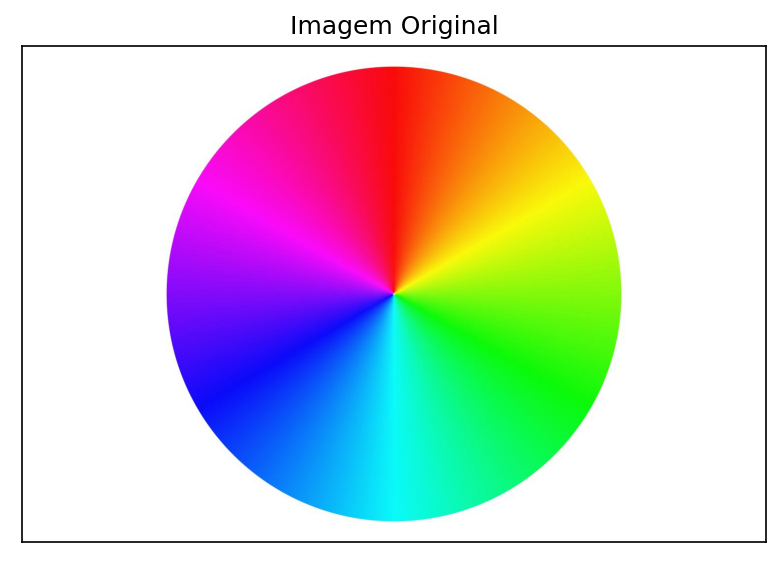

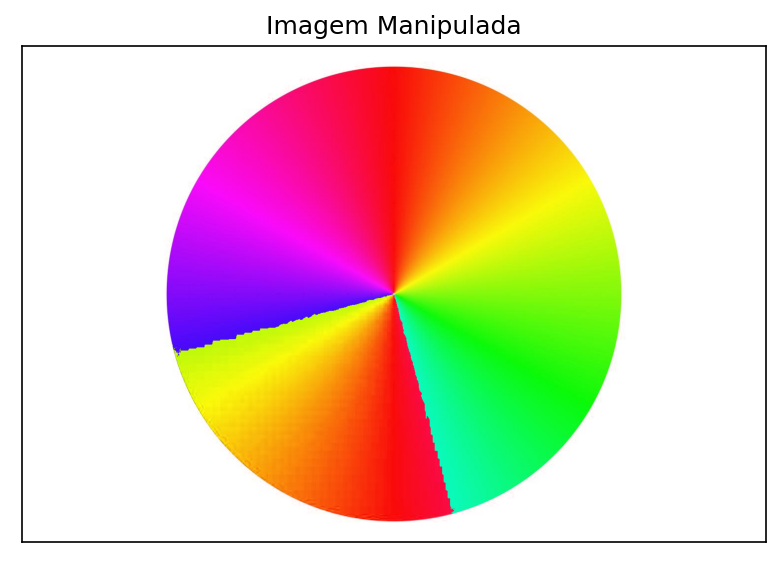

In [112]:
img = cv.imread("color-circle.jpg")
rgb_img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
plt.imshow(rgb_img)
plt.title("Imagem Original")
plt.xticks([])
plt.yticks([])
plt.show()

img_inv = manipulate(img, 210, 45)
plt.imshow(img_inv)
plt.title("Imagem Manipulada")
plt.xticks([])
plt.yticks([])
plt.show()

## Exemplo 2.

Mesma manipulação do Exemplo 1, mas aplicada a uma foto real

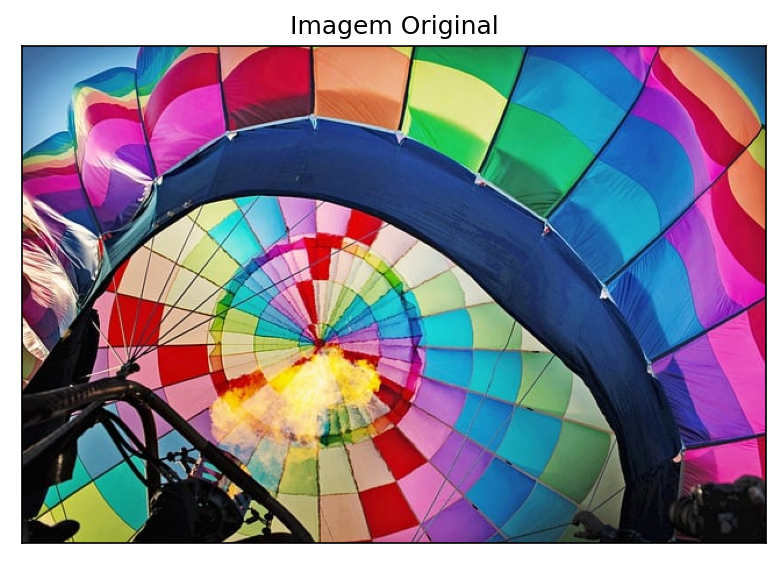

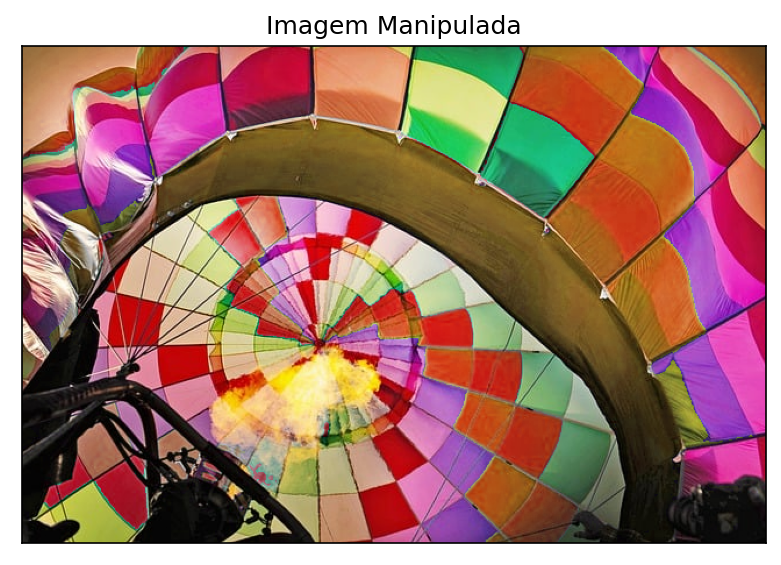

In [113]:
img = cv.imread("balloon.jpg")
rgb_img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
plt.imshow(rgb_img)
plt.title("Imagem Original")
plt.xticks([])
plt.yticks([])
plt.show()

img_inv = manipulate(img, 210, 45)
plt.imshow(img_inv)
plt.title("Imagem Manipulada")
plt.xticks([])
plt.yticks([])
plt.show()

## Animação

Manipulação de todas as faixas do círculo de cores apresentadas em sequência

In [107]:
def show_animation(img):
    fig = plt.figure()

    global m
    m = 20
    im = plt.imshow(img, animated=True)

    def updatefig(*_):
        global m
        m += 10
        im.set_array(manipulate(img, m, 40))
        return im,

    anim = animation.FuncAnimation(fig, updatefig, frames=29, interval=100, repeat_delay=500)
    plt.show()

img = cv.imread("color-circle.jpg")
show_animation(img)